# Importing Data

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
!cp '/content/gdrive/My Drive/AugmentedData3.zip' AugmentedData3.zip
!unzip AugmentedData3.zip
!cp '/content/gdrive/My Drive/AugmentedData4.zip' AugmentedData4.zip
!unzip AugmentedData4.zip
!cp '/content/gdrive/My Drive/AugmentedData5.zip' AugmentedData5.zip
!unzip AugmentedData5.zip

In [ ]:
!cp '/content/gdrive/My Drive/ObjectTestData3.zip' ObjectTestData3.zip
!cp '/content/gdrive/My Drive/ObjectDetectData.zip' ObjectDetectData.zip
!cp '/content/gdrive/My Drive/TestSet4.zip' TestSet4.zip
!unzip TestSet4.zip
!unzip ObjectDetectData.zip
!unzip ObjectTestData3.zip

# Importing Libraries





In [ ]:
%tensorflow_version 1.x
import random
import numpy as np
import pandas as pd
from os import listdir                                # Gives directories of all files in the form of a list for easy access to Colab files
from keras.preprocessing.image import load_img        # Loading images in PIL
from keras.preprocessing.image import img_to_array    # Converting PIL objects to array's
import matplotlib.pyplot as plt                       # Matlab Image Plotting

# Importing Keras Libraries for creating a CNN Architecture
from keras.models import Model
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from keras.utils import to_categorical
from keras import regularizers
from keras.optimizers import SGD



TensorFlow 1.x selected.


Using TensorFlow backend.


# Extraction and Organizing Data

In [ ]:
# ---------------------------------------------- HELPER FUNCTIONS FOR loadImages ---------------------------------------- #

def shuffle_two(a, b):
  ''' This function is responsible for shuffling two lists in unison'''
  x, y = a, b
  c = list(zip(x, y))
  random.shuffle(c)
  x, y = zip(*c)
  return x, y

def shuffle_three(a, b, c):
  ''' This function is responsible for shuffling three lists in unison'''
  x, y, z = a, b, c
  c = list(zip(x, y, z))
  random.shuffle(c)
  x, y, z = zip(*c)
  return x, y, z


def extractUniqueImages(directory, folder):
    ''' This function extracts the unique images (the ones that are originals and not augmented) from a 
    category subfolder based on augmentation weights. This is utilized to extract unique and unaugmentated data
    for the validation set. The functions returns a list of images, their corresponding labels, and filenames'''
    UI, UL, UF = list(), list(), list()
    numImages = len(listdir(directory+'/'+folder))  # Number of images in the subfolder
    print(folder + ':',  numImages)
    for i in range(0, numImages, Augmentation[folder]): # loop in steps based on augmentation weight of category
        filename =  directory + '/' + folder + '/' + str(i) + '.jpg'
        #print(filename)
        try: image = load_img(filename, target_size=(128, 64))
        except: continue
        try: image = img_to_array(image)
        except: continue
        UI.append(image)
        UL.append(categories[folder])
        UF.append(i)

    return UI, UL, UF

def augmentedImageNames(directory, folder, uniqueImageNames):
    ''' This function information of the filenames of the validation dataset images add the next n augmented filenames/images to a list,
    based on the augmentation weights. This information is utilized to keep training set completely different.'''
    filenames = []
    for filename in uniqueImageNames:
      filenames.append(directory +'/' + folder +'/' + str(filename) + '.jpg')
      index = int(filename)
      count = 1
      for i in range(Augmentation[folder]-1):
        filenames.append(directory +'/' + folder +'/' + str(index+count) + '.jpg')
        count += 1

    return filenames

# ---------------------------------------------- END HELPER FUNCTIONS FOR loadImages ---------------------------------------- #

categories = {'Alert': 0, 'Distracted': 1, 'UpMobile': 2, 'DownMobile': 3}    # For assigning labels to images when they are extracted from the respective folders

# Augmentation Weights: switch by commenting based on data your using --> Helps with unique and uniform distribution between training and validation data categories
Augmentation = {'Alert':4 , 'Distracted':6, 'UpMobile': 8, 'DownMobile': 6}  # AugmentedData4
#Augmentation = {'Alert':2 , 'Distracted':4, 'UpMobile': 3, 'DownMobile': 5}  # AugmentedData3


def loadImages(directory, split=0.40):
  ''' This functions loads the dataset from the colab directory into the test and validation lists '''

  TrainImages = []
  Trainlabels = []
  ValidationImages = []
  Validationlabels = []

  # For keeping track of files that have been used in the validation dataset
  Validationfilenames = []

  # Getting validation data
  for folder in listdir(directory):
    UI, UL, UF = extractUniqueImages(directory, folder) # extract unique images, labels and names for category via subfolder
    extractImages = len(UI)*split                 # number of images required based on split

    # Shuffle these unique images and add a percentage of them to the validation dataset
    uniqueImages, uniqueLabels, uniqueFilenames = shuffle_three(UI, UL, UF) 
    ValidationImages += uniqueImages[:int(extractImages)]
    Validationlabels += uniqueLabels[:int(extractImages)]
    UF = uniqueFilenames[:int(extractImages)]     # Also keep track of the filenames of these validation dataset images 

    print('Getting',  int(extractImages), 'out of', len(UI),'unique images for validation')

    Validationfilenames += augmentedImageNames(directory, folder, UF) # extract names of all augmented image names corresponding to those used in the validation set

  print("--------------------------------------------")

  # Getting Training Data
  for folder in listdir(directory):
    count = 0
    for image in listdir(directory+'/'+folder):
      filename =  directory + '/' + folder + '/' + image            # Fetch a files name
      if filename not in Validationfilenames:                       # Check if it isn't one of the files corresponding to validation images
          try: image = load_img(filename, target_size=(128, 64))    # If it isn't, continue loading it to the training data set
          except: continue
          try: image = img_to_array(image)
          except: continue
          TrainImages.append(image)
          Trainlabels.append(categories[folder])
          count += 1
    print('Training Data Extracted From ' + folder, count)

  return TrainImages, Trainlabels, ValidationImages, Validationlabels
  

In [ ]:
# ---------------------------------------------- PREPARING AND ARRANGING DATA ----------------------------------- #

# Loading data
a, b, c, d = loadImages('AugmentedData4', 0.15)

# Converting image array's from float type to int
a = [im.astype(int) for im in a]
c = [im.astype(int) for im in c]


#Shuffling Training Images and Labels in unison, so we don't have sequentially similar augmented data when feeding the CNN
TrainImages, Trainlabels = shuffle_two(a, b)
TrainImages, Trainlabels = np.array(TrainImages), np.array(Trainlabels)

#Shuffling Validation Images and Labels in unison, so we don't have sequentially similar augmented data when feeding the CNN
ValidationImages, Validationlabels = shuffle_two(c, d)
ValidationImages, Validationlabels = np.array(ValidationImages), np.array(Validationlabels)

# Total Count of Images
TimageCount = len(TrainImages)
TlabelCount = len(Trainlabels)
VimageCount = len(ValidationImages)
VlabelCount = len(Validationlabels)
print(' ')
print('Total Number of Train Images & Labels | Val Images & Labels: ', TimageCount, TlabelCount, ' | ',VimageCount, VlabelCount)

Distracted: 1539
Getting 37 out of 247 unique images for validation
DownMobile: 1644
Getting 40 out of 273 unique images for validation
UpMobile: 1464
Getting 27 out of 182 unique images for validation
Alert: 1688
Getting 63 out of 421 unique images for validation
--------------------------------------------
Training Data Extracted From Distracted 1317
Training Data Extracted From DownMobile 1404
Training Data Extracted From UpMobile 1248
Training Data Extracted From Alert 1436
 
Total Number of Train Images & Labels | Val Images & Labels:  5405 5405  |  167 167


# Training with Normal CNN

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Train on 5405 samples, validate on 167 samples
Epoch 1/40
5405/5405 [==============================] - 22s 4ms/step - loss: 1.4148 - acc: 0.2875 - val_loss: 1.3697 - val_acc: 0.3772
Epoch 2/40
5405/5405 [==============================] - 16s 3ms/step - loss: 1.3734 - acc: 0.3208 - val_loss: 1.3493 - val_acc: 0.4192
Epoch 3/40
5405/5405 [==============================] - 16s 3ms/step - loss: 1.3516 - acc: 0.3650 - val_loss: 1.3257 - val_acc: 0.4611
Epoch 4/40
5405/5405 [==============================] - 16s 3ms/step - loss: 1.3270 - acc: 0.4080 - val_loss: 1.3001 - val_acc: 0.4731
Epoch 5/40
5405/5405 [==============================] - 16s 3ms/step - loss: 1.3049 - acc: 0.4163 - val_loss: 1.2319 - val_acc: 0.4790
Epoch 6/40
5405/5405 [==============================] - 16s 3ms/step - loss: 1.2809 - acc: 0.4416 - val_loss: 1.2342 - val_acc: 0.4790
Epoch 7/40
5405/5405 [==============================] - 16s 

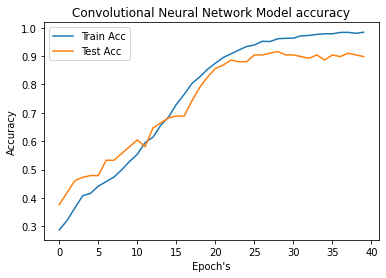

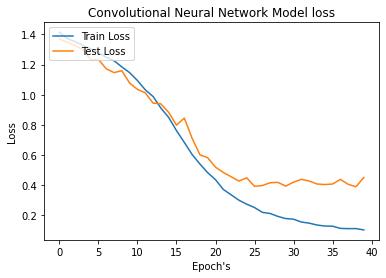

In [ ]:
# ------- LOADING DATA ------------ #
(x_train, y_train), (x_val, y_val) = (TrainImages, Trainlabels), (ValidationImages, Validationlabels)

# ----- FORMING VECTORS ----------- #
y_train = to_categorical(y_train)
y_val = to_categorical(y_val)


# ----- NORMALIZING DATA -------- #
mean_train = x_train.mean(axis = 0)
std_train = x_train.std(axis = 0)
x_train = (x_train - mean_train)/std_train

mean_test = x_val.mean(axis = 0)
std_test = x_val.std(axis = 0)
x_val = (x_val - mean_test)/std_test

'''
# ------- NORMALIZING --------
x_min = x_train.min(axis=(1, 2), keepdims=True)
x_max = x_train.max(axis=(1, 2), keepdims=True)
x_train = (x_train - x_min)/(x_max-x_min)

x_min = x_val.min(axis=(1, 2), keepdims=True)
x_max = x_val.max(axis=(1, 2), keepdims=True)
x_val = (x_val - x_min)/(x_max-x_min)
'''

# ----- Settings up the Convolutional Neural Network ------- #
in1 = Input(shape = x_train[0].shape)
c1 = Conv2D(32, (5, 5), activation = 'relu')(in1)
c2 = Conv2D(64, (3, 3), activation = 'relu', activity_regularizer=regularizers.l2(2e-6))(c1)
m1 = MaxPooling2D()(c2)
dr1 = Dropout(0.4)(m1)

c3 = Conv2D(128, (3, 3), activation = 'relu', activity_regularizer=regularizers.l2(10e-6))(dr1)
m2 = MaxPooling2D()(c3)
dr2 = Dropout(0.5)(m2)

fl = Flatten()(dr2)
d1 = Dense(512, activation = 'relu', activity_regularizer=regularizers.l2(1e-6))(fl)
dr3 = Dropout(0.6)(d1)
d2 = Dense(256, activation = 'relu')(dr3)
dr4 = Dropout(0.5)(d2)
out = Dense(len(y_train[0]), activation = 'softmax')(dr4)

model = Model(inputs = in1, outputs = out)
#sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['acc'])
track = model.fit(x_train, y_train, epochs = 40, batch_size = 16, validation_data=(x_val, y_val))

# Evaluating Model Performance 
model.evaluate(x_val, y_val)


#----- Plotting Train vs Test Accuracy of Model -------
print('\ntrack:', track.history)
val_acc = track.history['val_acc']

# ------ Accuracy Values --------
plt.plot(track.history['acc'])
plt.plot(track.history['val_acc'])
plt.title('Convolutional Neural Network Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch\'s')
plt.legend(['Train Acc', 'Test Acc'], loc='upper left')
plt.show()
plt.figure()

# ------ Loss Values -------
plt.plot(track.history['loss'])
plt.plot(track.history['val_loss'])
plt.title('Convolutional Neural Network Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch\'s')
plt.legend(['Train Loss', 'Test Loss'], loc='upper left')
plt.show()

In [ ]:
print(model.summary())

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 64, 3)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 124, 60, 32)       2432      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 122, 58, 64)       18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 61, 29, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 61, 29, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 59, 27, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 29, 13, 128)       0   

# Testing CNN with TestSet4 Data

In [ ]:
categories = {'Alert': 0, 'Distracted': 1, 'UpMobile': 2, 'DownMobile': 3}  

# For loading Images
def loadImagesTest(directory):
  ''' This functions loads the testing dataset from the colab directory'''
  images = []
  labels = []
  filenames = []

  for folder in listdir(directory):
    print(folder,  len(listdir(directory+'/'+folder)))
    for image in listdir(directory+'/'+folder):
        filenames.append(image)
        filename =  directory + '/' + folder + '/' + image
        try: image = load_img(filename, target_size=(128, 64))
        except: continue
        try: image = img_to_array(image)
        except: continue
        images.append(image)
        labels.append(categories[folder])

  return images, labels, filenames

# Test Images & Labels: loading, type conversion + shuffling
testImages, testLabels, testImageNames = loadImagesTest('TestSet4')
testImages = [im.astype(int) for im in testImages]
testImages, testLabels = np.array(testImages), np.array(testLabels)

# Total Count
testImageCount = len(testImages)
testLabelCount = len(testLabels)
print('Total Number of Test Images & Labels: ', testImageCount, testLabelCount)

Distracted 20
DownMobile 29
UpMobile 31
Alert 32
Total Number of Test Images & Labels:  112 112


In [ ]:
# -------------- NORMALIZING TEST IMAGES ----------------------------- #
#x_min = testImages.min(axis=(1, 2), keepdims=True)
#x_max = testImages.max(axis=(1, 2), keepdims=True)
#testImagesNorm = (testImages - x_min)/(x_max-x_min)

mean_train = testImages.mean(axis = 0)
std_train = testImages.std(axis = 0)
testImagesNorm = (testImages - mean_train)/std_train


# ------------- GETTING PREDICTION RESULTS FOR TEST IMAGES ------------ #
result_CNN = model.predict(testImagesNorm)

In [ ]:
index_to_categories = dict([[v,k] for k,v in categories.items()])   # Reversing Categories Dictionary

# ---- LISTS OF PREDICTED CLASSIFICATED VS ACTUAL CLASSIFICATION -----
Predicted = []
Actual = list(testLabels)

# ---- EXTRACTING PREDICTED RESULTS -------
for i in range(len(result_CNN)):
  vec = list(result_CNN[i])
  Predicted.append(vec.index(max(vec)))

# ---------------- HELPER FUNCTION FOR CALULATING TEST RESULTS ------------------- #

def resultCalculator(Predicted, Actual):
    overallCorrect = 0
    alertCorrect = 0
    distractCorrect = 0
    upmobileCorrect = 0
    downmobileCorrect = 0
    
    FP1alert = 0 
    FP2alert = 0
    FP3alert = 0

    FP0distract = 0
    FP2distract = 0
    FP3distract = 0

    FP0UpMobile = 0
    FP1UpMobile = 0
    FP3UpMobile = 0

    FP0DownMobile = 0
    FP1DownMobile = 0
    FP2DownMobile = 0

    for i in range(len(Predicted)):
      if Predicted[i] == Actual[i]: 
        overallCorrect += 1
        if Actual[i] == 0: alertCorrect += 1
        if Actual[i] == 1: distractCorrect += 1
        if Actual[i] == 2: upmobileCorrect += 1
        if Actual[i] == 3: downmobileCorrect += 1
      if Predicted[i] != Actual[i] and Actual[i] == 0:
        if Predicted[i] == 1: FP1alert += 1
        if Predicted[i] == 2: FP2alert += 1
        if Predicted[i] == 3: FP3alert += 1
      if Predicted[i] != Actual[i] and Actual[i] == 1:
        if Predicted[i] == 0: FP0distract += 1
        if Predicted[i] == 2: FP2distract += 1
        if Predicted[i] == 3: FP3distract += 1
      if Predicted[i] != Actual[i] and Actual[i] == 2:
        if Predicted[i] == 0: FP0UpMobile += 1
        if Predicted[i] == 1: FP1UpMobile += 1
        if Predicted[i] == 3: FP3UpMobile += 1
      if Predicted[i] != Actual[i] and Actual[i] == 3:
        if Predicted[i] == 0: FP0DownMobile += 1
        if Predicted[i] == 1: FP1DownMobile += 1
        if Predicted[i] == 2: FP2DownMobile += 1


    #------------------    CALCULATING % ACCURACY AND FALSE POSITIVE ------------------------------- #


    if len(Actual) > 0: overallAcc = (overallCorrect/len(Actual)) * 100
    if Actual.count(0) > 0: alertAcc = (alertCorrect/Actual.count(0)) * 100
    if Actual.count(1) > 0: distractAcc = (distractCorrect/Actual.count(1)) * 100
    if Actual.count(2) > 0: upmobileAcc = (upmobileCorrect/Actual.count(2)) * 100
    if Actual.count(3) > 0: downmobileAcc = (downmobileCorrect/Actual.count(3)) * 100


    print('--------------------------------------------------------- TEST DATA RESULTS ------------------------------------------------------')
    print('Category', '           ', 'Accuracy', '    ', 'Ratio',  '','FP\'s:', ' Alert', '   Distracted', '   UpMobile', '   DownMobile')
    print('Overall Accuracy:     ', int(overallAcc), '%', '     ',     str(overallCorrect) + '/' + str(len(Actual)))
    print('Alert Accuracy:       ', int(alertAcc), '%', '     ',       str(alertCorrect) + '/' + str(Actual.count(0)),  '   ', '               ', str(round((FP1alert/(Actual.count(0)))*100, 2))+' %', '    ', str(round((FP2alert/(Actual.count(0)))*100, 2))+' %','    ',  str(round((FP3alert/(Actual.count(0) - alertCorrect))*100, 2))+' %')  
    print('Distracted Accuracy:  ', int(distractAcc), '%', '     ',    str(distractCorrect) + '/' + str(Actual.count(1)),  '       ' ,  str(round((FP0distract/(Actual.count(1)))*100, 2))+' %', '                 ', str(round((FP2distract/(Actual.count(1)))*100, 2))+' %','    ',  str(round((FP3distract/(Actual.count(1) ))*100, 2))+' %') 
    print('UpMobile Accuracy:    ', int(upmobileAcc), '%', '     ',    str(upmobileCorrect) + '/' + str(Actual.count(2)),  '        ',  str(round((FP0UpMobile/(Actual.count(2)))*100, 2))+' %', '  ', str(round((FP1UpMobile/(Actual.count(2)))*100, 2))+' %','                 ',  str(round((FP3UpMobile/(Actual.count(2) ))*100, 2))+' %') 
    print('DownMobile Accuracy:  ', int(downmobileAcc), '%', '     ',  str(downmobileCorrect) + '/' + str(Actual.count(3)),  '        ',  str(round((FP0DownMobile/(Actual.count(3) ))*100, 2 ))+' %', '  ', str(round((FP1DownMobile/(Actual.count(3) ))*100, 2))+' %','      ',  str(round((FP2DownMobile/(Actual.count(3) ))*100, 2))+' %') 



    # ------------------ END HELPER VARIABLES FOR EXTRACTING RESULTS --------------------------------- # 
  
  
resultCalculator(Predicted, Actual)
      

--------------------------------------------------------- TEST DATA RESULTS ------------------------------------------------------
Category             Accuracy      Ratio  FP's:  Alert    Distracted    UpMobile    DownMobile
Overall Accuracy:      57 %       64/112
Alert Accuracy:        81 %       26/32                     9.38 %      9.38 %      0.0 %
Distracted Accuracy:   45 %       9/20         25.0 %                   5.0 %      25.0 %
UpMobile Accuracy:     41 %       13/31          35.48 %    16.13 %                   6.45 %
DownMobile Accuracy:   55 %       16/29          31.03 %    6.9 %        6.9 %


# Testing CNN with ObjectTestData3

In [ ]:
df = pd.read_csv('/content/Bounding Box Coordinates.csv')
lst  = L = df.values.tolist()

## ----------------------------- HELPER FUNCTIONS FORKED FROM NEURAL NETWORK CODES -------------------------------- ##

lstBB = [] #making a nested list, each list has the image name and the coordinates for the bounding box
for i in lst:
  temp = []
  for j in i[0:5]:
    temp.append(j)
  lstBB.append(temp)
import cv2

def getBB(imgName): #function to get bounding box and a given imagename
  lst1 = []
  for i in lstBB:
    if imgName == i[0]:
      lst1.append(i[1:5])
  return lst1

def makeBox(imgName,title): #extracts the single object data
  BBinfo = []
  for folder in listdir('/content/ObjectTestData3'):
    for img in listdir('/content/ObjectTestData3'+'/' + folder):
      temp = []
      info = img.split('-')
      for i in info[1:5]:
        temp.append(int(i))
      temp.append(info[5])
      BBinfo.append(temp)
  
  img1 = imgName.split('-')

  L1 = []

  for i in img1[1:5]:
    L1.append(int(i))
  for i in BBinfo:
    if ((i[4] == img1[5]) and i[0:4] == L1):
      image = cv2.imread('/content/ObjectDetectData/'+img1[5])
      x2 = i[0]
      y2 = i[1]
      x1 = i[2]
      y1 = i[3]
      cv2.rectangle(image, (x1, y1), (x2, y2), (255,0,0), 2)
      cv2.putText(image, title, (x1-80, y1), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 2)

      plt.imshow(image)
      plt.title(img1[5])
      plt.figure()

## ----------------------------- END HELPER FUNCTIONS FORKED FROM NEURAL NETWORK CODES -------------------------------- ##

# Test Images & Labels: loading, type conversion + shuffling
testImages, testLabels, testImageNames = loadImagesTest('ObjectTestData3')
testImages = [im.astype(int) for im in testImages]
testImages, testLabels = np.array(testImages), np.array(testLabels)

# Total Count
testImageCount = len(testImages)
testLabelCount = len(testLabels)
print('Total Number of Test Images & Labels: ', testImageCount, testLabelCount)

Distracted 16
DownMobile 4
UpMobile 6
Alert 37
Total Number of Test Images & Labels:  63 63


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


IndexError: ignored

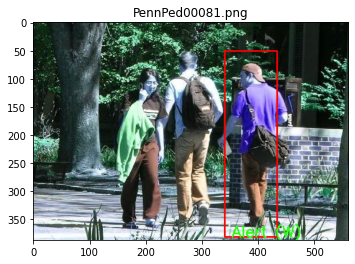

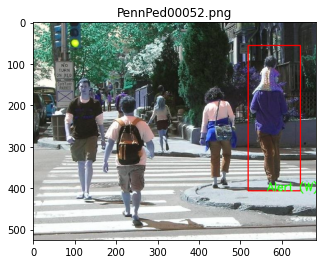

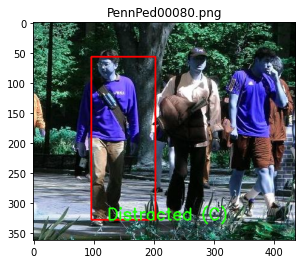

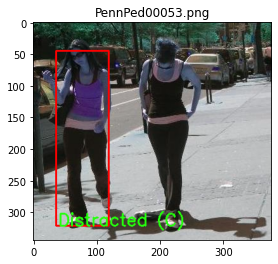

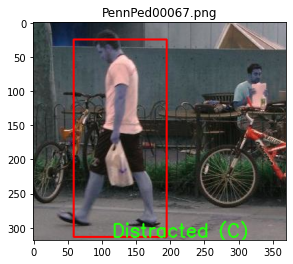

...

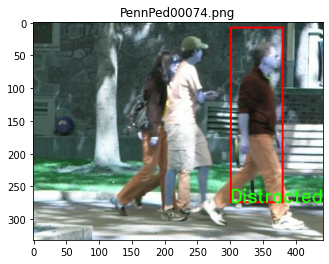

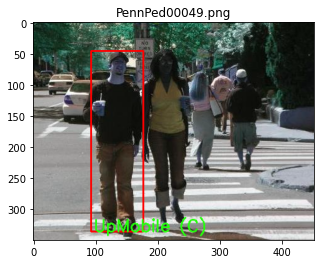

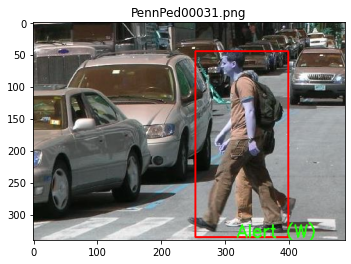

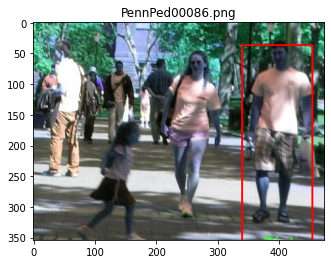

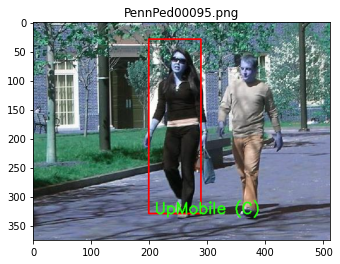

<Figure size 432x288 with 0 Axes>

In [ ]:
## ----------------------------- IMAGE RESULTS + TEXT RESULTS FOR OBJECTTESTDATA3 ------------------------------------- ##
Predicted = []

for i in range(len(result_CNN)):
  vec = list(result_CNN[i])
  Predicted.append(vec.index(max(vec)))
  if (str(index_to_categories[vec.index(max(vec))]) == str(index_to_categories[Actual[i]])):
    makeBox(testImageNames[i],str(index_to_categories[vec.index(max(vec))])+' (C)' )
  else:
    makeBox(testImageNames[i],str(index_to_categories[vec.index(max(vec))])+' (W)' )

In [ ]:
resultCalculator(Predicted, Actual)